In [1]:
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from ipywidgets import interact

import sys
sys.path.append("..")

# from conc_obj import EEGData
from classes.eeg_data import EEGData
from utils.plt import plot_psd, plot_montage
from utils.ica import plot_ica_comp

# MNE imports
import mne
from mne.io.edf import read_raw_edf
from mne.datasets import eegbci

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score

import json


***Macros***

>General use macros, importing JSON files to use as the configuration files

In [2]:
script_path = Path().resolve()
main_folder = (script_path / "../").resolve()
proj_folder = (script_path / "../../").resolve()

JSON_MAIN_PATH = main_folder / "config/config_main.json"
JSON_CSP_PATH = main_folder / "config/config_csp.json"
JSON_GRID_PATH = main_folder / "config/config_grid.json"
EVENTS_PATH = main_folder / "config/events.json"

with open(JSON_MAIN_PATH, "r") as f:
    config_main = json.load(f)

with open(JSON_CSP_PATH, "r") as f:
    config_csp = json.load(f)

with open(JSON_GRID_PATH, "r") as f:
    json_grid = json.load(f)

VERBOSE = config_main['verbose'].lower() == 'true'

L_FREQ = config_main['l_freq']
H_FREQ = config_main['h_freq']

N_SUBJECTS = config_main["n_subjects"]
N_COMPONENTS_ICA = config_main["n_components_ica"]



In [3]:
mne.set_log_level('critical')

***Initialization of EEG object***

>***(If the files are not locally stored, it will download them to the user system automatically)***

>***Use of functions like .filter_data() also is obligatory if there is no data stored locally***

In [4]:

eeg_obj = EEGData(config_main, config_csp, proj_folder, verbose=VERBOSE)

In [5]:
#* Filters data and plots PSD to see differences
# eeg_obj.filter_data()
# eeg_obj.plot_psd_ba_filt(verbose=VERBOSE)

***Prediction - Loading testing data & ML models***

>***If we don't want to train our model and want to make predictions or see any metric right away, we can load the data and call the methods right away.***

>***Take into account that in order to change the events or any other parameter in the tools/methods loaded, you will have to train and save the entire model/data again!***

In [6]:

# X_test, y_test = eeg_obj.load_models()
# eeg_obj.pred(X_test, y_test)

**Basic information and montage plotting in 2D & 3D**
> ***The channel names can also be printed***

<Figure size 640x480 with 0 Axes>

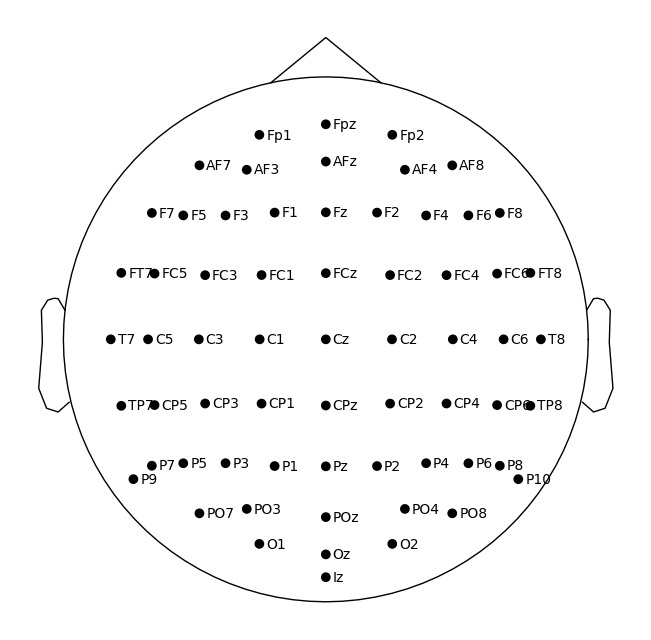

<Figure size 640x480 with 0 Axes>

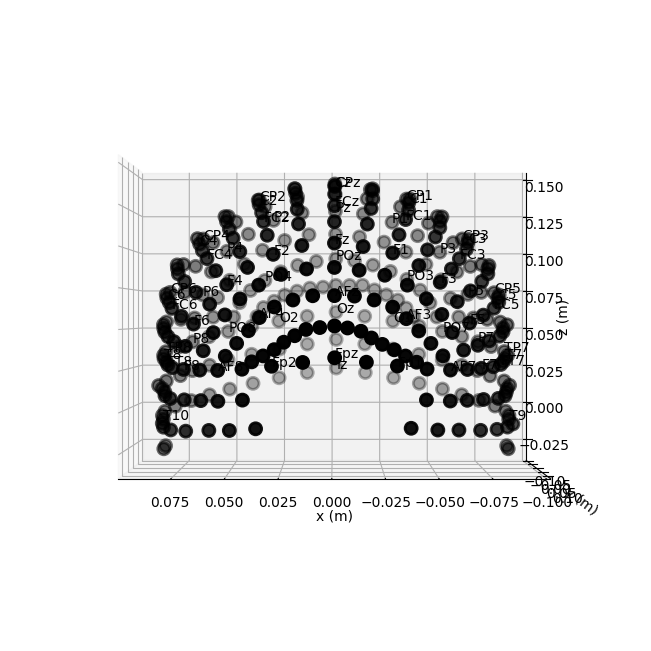

In [7]:

#* Plots different montages in 2D & 3D
data_h, data_hf = eeg_obj.get_raw()

ch_names = data_h.info["ch_names"] 

plot_montage(eeg_obj.montage, ch_names)

**ICA(Independent Component Analysys)**
> ***The number of components that ICA will try to sort out can be changed, it is advised to use values in the range [16-64]***

> ***Ocular artifacts are also removed, since they don't contribute to the muscular movement on this evaluation***

> ***The components can also be plotted and ocular artifacts, EOG, will be clearly visible***

In [8]:

#* Computes ICA components ( If loaded locally do not use! )
# eeg_obj.decomp_ica(n_components=N_COMPONENTS_ICA, plt_show=True, verbose=VERBOSE)

#* Plot components of ICA
# plot_ica_comp(proj_folder / config_main["path_ica_h"])

**Specify events & create Epochs**
> ***The events used along with the JSON configuration will be crucial for the ML algorimths to work properly***


In [9]:

#* Loads cleaned data and events
data_h, data_hf = eeg_obj.get_clean()
events_h, events_hf = eeg_obj.get_events()

#* Creates epochs and frequency bands
ev_list = config_csp["ev_blist_one"]
epochs, freq_bands = eeg_obj.crt_epochs(data_h, events_h, ev_list, "hands", verbose=VERBOSE)

print()
epochs_data = epochs.get_data()
labels = epochs.events[:, -1]
print()


Event dict. :  {'do/left_hand': 1, 'do/right_hand': 2}




In [10]:
print(np.unique(events_h[:, -1]))
print(np.unique(labels))
print(ev_list)
print(epochs_data.shape)
print(data_h.get_data().shape)

[1 2 3 4 5]
[1 2]
[[1, 2]]
(900, 64, 641)
(64, 2367360)


***CSP - Common Spatial Pattern(s)***

>Separates multivariate signals into additive components which have maximum differences in variance between two windows.

>Specially used on MEG & EEG datasets for motor imagery decoding.

(900, 64, 641) (900,)


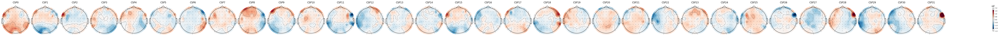

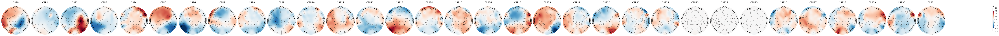

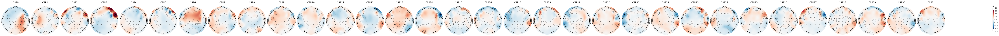

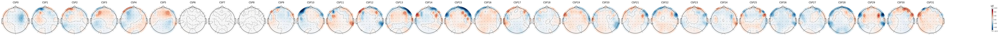

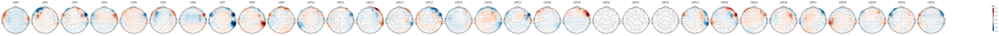

Shape after CSP: (900, 160)


In [11]:
N_COMPONENTS_CSP = config_csp["n_components"]
features, csp = eeg_obj.csp(epochs_data, labels, freq_bands, epochs.info, verbose=VERBOSE)

#* Two step CSP
# features, labels = eeg_obj.two_step_csp(epochs1, epochs2, freq_bands, verbose=VERBOSE)

#* Verify any shape
print("Shape after CSP:", features.shape)

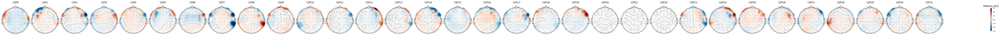

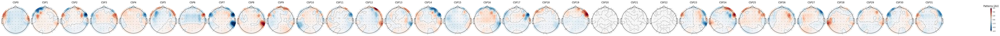

In [12]:


#* Only use plot_patters if you are not using PCA before
csp.plot_patterns(epochs.info, ch_type="eeg", units="Patterns (AU)", size=1.5)

#* Displays the performance of CSP along classifiers through a timeline
# eeg_obj.csp_performance(epochs, labels, clf_type='rf', verbose=False)

**Normalize and apply PCA(Principal Component Analysis)**
> ***Faster computation, training, testing, ...***

> ***Reduces the risk of over-fitting***

> ***Improves the accuracy of classification ML algorimths***

In [13]:
#* Normalizes data
# features_norm = eeg_obj.normalize(features)
features = StandardScaler().fit_transform(features)

#* Reduce dimensionality (PCA)
# features_pca = eeg_obj.pca(features_norm)
pca = PCA(n_components=0.99)
# features = pca.fit_transform(features)
print(features.shape, labels.shape)

(900, 160) (900,)


***Pipeline***

>The dimensionality reduction tools, classifications algorimths and signal processing (CSP) are included.

>The default values/functions have been proved to be good over tests.

In [14]:
from utils.pipeline import crt_pipeline

pipeline = crt_pipeline(clf=False, clf_type='rf', voting='soft')


ValueError: Invalid classifier type

***GridSearch - Parameter selection***

>Exhaustive search over specified parameter values for an estimator.

>The default values have been tested. Performance varies from event type selection.

In [ ]:
from utils.grid_search import grid_finder, grid_search

grid, pipepline_grid = grid_finder(json_grid, 'rf', 'wide')
print(grid, pipepline_grid)
# grid_search(features, labels, pipepline_grid, grid)

***Cross Validation - The good ol' tester***

>We can choose the n_splits along with the pipeline. (Can be both customized before)

>It ensures that the training/testing datasets are not mixed & calculates the average score over the K-folds.

In [ ]:
#* Trains and evaluates model
scores = eeg_obj.cross_val(features, labels, pipeline, n_splits=10)
print("Mean score:", np.mean(scores))

# scores = eeg_obj.cross_validate(features, labels, pipeline, n_splits=10)

In [ ]:
from sklearn.model_selection import train_test_split


#* Divide the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42, shuffle=True)

eeg_obj.train_model(X_train, y_train)

eeg_obj.pred(X_test, y_test, n_preds=15)

In [ ]:
#* Saves filtered and concatenated data for faster loading
# eeg_obj.save_type_data(type="events", verbose=VERBOSE)
# eeg_obj.save_type_data(type="raw", verbose=VERBOSE)
# eeg_obj.save_type_data(type="filtered", verbose=VERBOSE)
# eeg_obj.save_type_data(type="ica", verbose=VERBOSE)
# eeg_obj.save_type_data(type="clean", verbose=VERBOSE)
# eeg_obj.save_type_data(type="epochs")
# eeg_obj.save_models(X_test, y_test)